# Xception architecture using CUB dataset
In this notebook I will attempt to train the [Xception](https://keras.io/api/applications/xception/) CNN model architecture using weights derived from the `imagenet` dataset on the Caltech-UCSD Birds-200-2011 (CUB-200-2011) datset in order to classify images of birds into 200 classes.

## Create a `tf.data.Dataset` from pandas dataframe `images`
* **TODO**: Create a tf.data.Dataset generator for pulling images from a compressed file using tarfile and determine if there is a performance hit by doing so and, if so, to what degree?

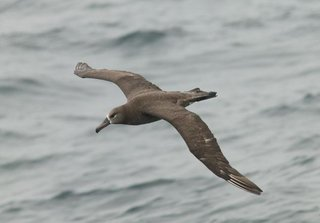

bounding_boxes
(11788, 4)
Any NaNs? False
       1      2      3      4
0                            
1   60.0   27.0  325.0  304.0
2  139.0   30.0  153.0  264.0
3   14.0  112.0  388.0  186.0
4  112.0   90.0  255.0  242.0
5   70.0   50.0  134.0  303.0

classes
(200, 1)
Any NaNs? False
                            1
0                            
1  001.Black_footed_Albatross
2        002.Laysan_Albatross
3         003.Sooty_Albatross
4       004.Groove_billed_Ani
5          005.Crested_Auklet

image_class_labels
(11788, 1)
Any NaNs? False
   1
0   
1  1
2  1
3  1
4  1
5  1

images
(11788, 1)
Any NaNs? False
                                                   1
0                                                   
1  001.Black_footed_Albatross/Black_Footed_Albatr...
2  001.Black_footed_Albatross/Black_Footed_Albatr...
3  001.Black_footed_Albatross/Black_Footed_Albatr...
4  001.Black_footed_Albatross/Black_Footed_Albatr...
5  001.Black_footed_Albatross/Black_Footed_Albatr...

train_test_spli

In [1]:
%run xc_cub_00-metadata.ipynb

In [2]:
import tensorflow as tf
# from tensorflow.python.keras.preprocessing.image import ImageDataGenerator

In [3]:
img_height = img_width = 299
batch_size = 32
dataset = tf.keras.utils.image_dataset_from_directory(
    '../cub/CUB_200_2011/images',
    image_size=(img_height, img_width),
    batch_size=None,
)

Found 11788 files belonging to 200 classes.


In [4]:
for el in dataset:
    print(el)

(<tf.Tensor: shape=(299, 299, 3), dtype=float32, numpy=
array([[[248.      , 253.      , 249.      ],
        [251.      , 253.      , 250.      ],
        [251.      , 253.      , 250.      ],
        ...,
        [ 56.45144 ,  99.810524,  77.16961 ],
        [ 69.7289  , 108.58359 ,  87.2208  ],
        [ 68.191216, 100.199486,  84.14272 ]],

       [[249.01338 , 252.49332 , 249.      ],
        [250.49332 , 252.49332 , 249.49332 ],
        [250.49332 , 252.49332 , 249.49332 ],
        ...,
        [ 61.982857,  98.900444,  78.88228 ],
        [ 62.932747, 100.4385  ,  80.44942 ],
        [ 68.13046 , 100.47513 ,  86.3319  ]],

       [[249.15552 , 251.15552 , 248.15552 ],
        [250.      , 252.      , 249.      ],
        [250.      , 252.      , 249.      ],
        ...,
        [ 63.656265,  97.842575,  83.30809 ],
        [ 62.80412 ,  98.98204 ,  84.48216 ],
        [ 65.38009 ,  99.18057 ,  88.86127 ]],

       ...,

       [[132.15552 , 141.38004 , 149.4284  ],
        [125

(<tf.Tensor: shape=(299, 299, 3), dtype=float32, numpy=
array([[[139.28969 , 133.57782 , 123.140465],
        [137.87625 , 135.56305 , 121.118904],
        [141.61453 , 131.77286 , 119.05127 ],
        ...,
        [139.33989 , 125.937035, 128.74591 ],
        [137.57378 , 127.57378 , 125.71424 ],
        [135.00795 , 126.91469 , 125.19446 ]],

       [[137.4214  , 133.55952 , 126.38679 ],
        [137.84897 , 132.14883 , 124.5249  ],
        [137.71817 , 130.3696  , 123.42642 ],
        ...,
        [137.01758 , 123.3455  , 126.25917 ],
        [134.17386 , 123.33105 , 123.59526 ],
        [133.83932 , 124.61238 , 125.029   ]],

       [[134.2581  , 131.5184  , 126.854515],
        [136.89049 , 128.89049 , 126.59283 ],
        [134.55351 , 129.07333 , 127.0511  ],
        ...,
        [135.63704 , 121.59532 , 124.275894],
        [132.30847 , 120.30847 , 122.30847 ],
        [133.12076 , 123.12076 , 124.12076 ]],

       ...,

       [[ 85.38829 ,  69.6929  ,  66.70644 ],
        [ 88

(<tf.Tensor: shape=(299, 299, 3), dtype=float32, numpy=
array([[[ 32.87429 ,  33.466564,  21.286423],
        [ 43.208755,  35.23246 ,  26.555342],
        [ 93.922104,  69.89988 ,  56.021656],
        ...,
        [ 38.42044 ,  30.86502 ,  38.422684],
        [ 81.694695,  62.870716,  45.455055],
        [ 54.023083,  56.68311 ,  30.089268]],

       [[ 48.079185,  42.72542 ,  37.074013],
        [ 45.47131 ,  35.25617 ,  23.772469],
        [ 88.77924 ,  76.362564,  59.979214],
        ...,
        [ 36.648457,  30.236849,  35.801743],
        [ 89.61871 ,  75.072754,  50.670876],
        [ 67.152885,  67.96646 ,  30.05982 ]],

       [[ 43.459217,  37.72254 ,  30.104435],
        [ 44.338573,  37.18562 ,  29.459484],
        [ 54.91069 ,  47.860477,  40.167217],
        ...,
        [ 35.609333,  30.621443,  37.520184],
        [ 90.79068 ,  84.30298 ,  54.986374],
        [ 77.14123 ,  87.16084 ,  35.2997  ]],

       ...,

       [[ 56.393463,  37.877472,  21.914248],
        [ 60

(<tf.Tensor: shape=(299, 299, 3), dtype=float32, numpy=
array([[[171.3194  , 163.74773 , 152.6173  ],
        [163.82108 , 166.83731 , 145.82059 ],
        [163.51004 , 167.73387 , 144.81126 ],
        ...,
        [147.05751 , 129.08093 , 117.46562 ],
        [143.07446 , 128.28429 , 107.25242 ],
        [142.66391 , 131.57436 , 104.208786]],

       [[171.0356  , 164.94267 , 151.58623 ],
        [161.16364 , 164.      , 142.9847  ],
        [161.13783 , 163.3194  , 141.85117 ],
        ...,
        [147.88562 , 136.57513 , 106.13402 ],
        [144.7156  , 133.6837  , 110.34414 ],
        [143.29027 , 136.28886 , 107.10315 ]],

       [[168.7095  , 164.47516 , 148.99141 ],
        [163.13713 , 164.28429 , 143.27829 ],
        [164.49834 , 163.79716 , 143.44264 ],
        ...,
        [151.38904 , 140.82495 , 108.50928 ],
        [148.88853 , 137.00597 , 105.607185],
        [147.37767 , 139.23227 , 104.04946 ]],

       ...,

       [[170.24036 , 169.32776 , 150.80911 ],
        [171

(<tf.Tensor: shape=(299, 299, 3), dtype=float32, numpy=
array([[[194.84163 , 202.81366 , 192.15768 ],
        [169.79294 , 171.15346 , 158.59485 ],
        [167.7727  , 171.9221  , 147.82596 ],
        ...,
        [119.65524 , 166.93515 ,  42.917984],
        [124.317375, 162.63545 ,  67.06288 ],
        [127.73729 , 171.47366 ,  77.26049 ]],

       [[176.2916  , 178.4949  , 178.04839 ],
        [153.63217 , 157.05098 , 159.05608 ],
        [146.08049 , 133.4445  , 133.88335 ],
        ...,
        [142.68443 , 184.5735  , 100.48887 ],
        [110.149055, 160.87599 ,  67.19469 ],
        [124.66643 , 177.86356 ,  75.25362 ]],

       [[154.56552 , 150.56195 , 142.50409 ],
        [146.88417 , 144.14848 , 133.72131 ],
        [127.152626, 110.13826 ,  99.754776],
        ...,
        [138.19276 , 168.7579  ,  92.72073 ],
        [129.59363 , 170.21507 ,  87.484634],
        [134.6264  , 173.66771 ,  75.032135]],

       ...,

       [[ 94.30388 , 115.920235,  54.048077],
        [177

(<tf.Tensor: shape=(299, 299, 3), dtype=float32, numpy=
array([[[149.     , 168.     ,  89.     ],
        [149.     , 168.     ,  89.     ],
        [149.42308, 168.42308,  89.42308],
        ...,
        [215.46152, 209.46152, 150.30768],
        [218.34616, 212.34616, 153.03848],
        [219.     , 213.     , 155.     ]],

       [[148.62709, 167.62709,  88.62709],
        [148.87091, 167.87091,  88.87092],
        [149.42308, 168.42308,  89.42308],
        ...,
        [217.69897, 211.69897, 152.2296 ],
        [220.45453, 214.45453, 154.88869],
        [220.86455, 214.86455, 156.11873]],

       [[148.04515, 167.04515,  88.04515],
        [148.66946, 167.66946,  88.66948],
        [149.42308, 168.42308,  89.42308],
        ...,
        [221.19061, 215.19061, 155.22882],
        [223.74472, 217.74472, 157.77599],
        [223.77425, 217.77425, 157.86455]],

       ...,

       [[135.04515, 156.04515,  79.04515],
        [135.04515, 156.04515,  79.04515],
        [135.02605, 156.02

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



(<tf.Tensor: shape=(299, 299, 3), dtype=float32, numpy=
array([[[207.39465, 197.39465, 172.39465],
        [208.99164, 198.99164, 173.99164],
        [208.     , 198.     , 173.     ],
        ...,
        [211.64075, 198.64075, 166.56108],
        [211.     , 198.     , 166.     ],
        [211.     , 198.     , 166.     ]],

       [[208.45268, 198.45268, 173.45268],
        [208.81752, 198.81606, 173.82047],
        [208.     , 197.82442, 173.35117],
        ...,
        [210.88051, 197.88051, 164.51936],
        [211.     , 198.     , 166.     ],
        [211.     , 198.     , 166.     ]],

       [[208.12207, 199.     , 173.70735],
        [207.12207, 197.70145, 173.30447],
        [207.32124, 197.19917, 174.90652],
        ...,
        [210.22595, 197.22595, 163.8648 ],
        [210.70735, 197.70735, 165.70735],
        [210.70735, 197.70735, 165.70735]],

       ...,

       [[174.02621, 158.44095, 139.73358],
        [187.42998, 171.15753, 154.57124],
        [180.35092, 166.47

(<tf.Tensor: shape=(299, 299, 3), dtype=float32, numpy=
array([[[117.02417  , 158.02417  , 211.25645  ],
        [118.14321  , 158.14322  , 210.06354  ],
        [117.391304 , 157.3913   , 208.3913   ],
        ...,
        [ 89.110466 , 108.25873  ,  87.58983  ],
        [ 71.586525 ,  88.6721   ,  18.488527 ],
        [ 79.89467  ,  90.83726  ,  12.002008 ]],

       [[117.1204   , 158.33612  , 209.90468  ],
        [119.777725 , 159.77773  , 210.77953  ],
        [118.3194   , 158.3194   , 209.53511  ],
        ...,
        [ 76.09627  ,  90.52217  ,  27.886606 ],
        [ 81.733444 , 101.86924  ,  44.372757 ],
        [ 95.17964  , 117.86615  , 104.8527   ]],

       [[116.33612  , 158.33612  , 207.85875  ],
        [118.996994 , 158.997    , 210.00536  ],
        [117.95986  , 157.95987  , 209.95987  ],
        ...,
        [ 80.77179  , 106.74794  ,  80.49011  ],
        [100.5241   , 130.31943  , 151.42618  ],
        [110.99477  , 149.02808  , 196.88213  ]],

       ...,

    

(<tf.Tensor: shape=(299, 299, 3), dtype=float32, numpy=
array([[[ 62.67224 ,  67.      ,  47.33612 ],
        [ 66.025085,  69.01672 ,  50.      ],
        [ 70.18138 ,  72.18138 ,  51.18138 ],
        ...,
        [145.8082  , 146.9448  , 125.126114],
        [139.02719 , 143.02719 , 120.0272  ],
        [132.09708 , 135.09708 , 114.09707 ]],

       [[ 62.67224 ,  66.47378 ,  48.388557],
        [ 66.025085,  69.01009 ,  50.013256],
        [ 69.6806  ,  71.42744 ,  51.18694 ],
        ...,
        [144.24907 , 146.63474 , 124.82169 ],
        [139.02672 , 142.23409 , 120.81937 ],
        [132.07796 , 135.07796 , 114.077965]],

       [[ 63.01505 ,  66.33612 ,  48.879715],
        [ 66.00836 ,  69.00836 ,  50.645134],
        [ 68.142685,  71.142685,  52.142685],
        ...,
        [142.93916 , 145.4771  , 124.4771  ],
        [137.03065 , 140.03065 , 119.03065 ],
        [131.00827 , 134.00827 , 113.00827 ]],

       ...,

       [[ 40.984955,  43.984955,  32.984955],
        [ 39

(<tf.Tensor: shape=(299, 299, 3), dtype=float32, numpy=
array([[[153.38977  , 173.38977  , 111.306244 ],
        [149.78322  , 169.77486  , 110.80829  ],
        [154.71037  , 173.02977  , 121.18239  ],
        ...,
        [ 68.80779  ,  88.80779  ,  36.446648 ],
        [ 64.219475 ,  84.219475 ,  33.219475 ],
        [ 65.69764  ,  85.03373  ,  38.025455 ]],

       [[157.92247  , 177.92247  , 117.29344  ],
        [154.42581  , 174.41745  , 115.44627  ],
        [150.37051  , 169.06549  , 114.80429  ],
        ...,
        [ 60.835907 ,  80.83591  ,  28.474762 ],
        [ 63.348217 ,  83.34821  ,  32.348217 ],
        [ 62.11219  ,  81.44828  ,  34.44001  ]],

       [[152.53545  , 172.53545  , 111.5894   ],
        [152.85847  , 172.8578   , 113.85982  ],
        [147.70074  , 167.62047  , 108.91592  ],
        ...,
        [ 68.64477  ,  88.64477  ,  36.283627 ],
        [ 62.94272  ,  82.94272  ,  31.94272  ],
        [ 63.41068  ,  82.74677  ,  35.7385   ]],

       ...,

    

(<tf.Tensor: shape=(299, 299, 3), dtype=float32, numpy=
array([[[169.25839 , 169.70998 , 177.59222 ],
        [174.80417 , 174.80453 , 174.8311  ],
        [175.41882 , 175.56587 , 176.25084 ],
        ...,
        [198.62012 , 199.47974 , 202.28717 ],
        [199.59492 , 199.87753 , 198.11122 ],
        [197.99539 , 198.92747 , 195.15295 ]],

       [[165.13824 , 170.61223 , 173.86176 ],
        [166.31554 , 166.26869 , 168.50447 ],
        [163.57085 , 170.42111 , 169.50444 ],
        ...,
        [184.18547 , 192.93266 , 199.34686 ],
        [181.83896 , 194.44765 , 202.57808 ],
        [183.68547 , 196.29416 , 202.55504 ]],

       [[166.49124 , 168.83252 , 170.87743 ],
        [169.441   , 169.02264 , 175.32365 ],
        [162.06259 , 169.73706 , 170.41472 ],
        ...,
        [194.91975 , 201.09576 , 204.49084 ],
        [193.98424 , 200.76685 , 210.11377 ],
        [198.14696 , 204.92957 , 214.42172 ]],

       ...,

       [[138.02908 , 141.95601 , 142.13943 ],
        [137

(<tf.Tensor: shape=(299, 299, 3), dtype=float32, numpy=
array([[[134.45242, 172.45242, 211.45242],
        [133.50943, 170.36562, 209.74689],
        [134.33612, 169.33612, 209.33612],
        ...,
        [135.67224, 173.     , 209.     ],
        [134.84557, 172.58925, 208.58925],
        [134.33612, 172.33612, 208.33612]],

       [[133.9927 , 171.9927 , 208.9927 ],
        [134.75616, 171.62192, 209.     ],
        [135.9939 , 171.00305, 209.     ],
        ...,
        [137.99164, 173.99164, 209.99164],
        [137.99681, 173.99681, 209.99681],
        [138.     , 174.     , 210.     ]],

       [[133.72119, 171.72119, 208.72119],
        [134.     , 172.     , 209.     ],
        [135.2709 , 171.36455, 209.     ],
        ...,
        [137.24811, 172.75189, 209.     ],
        [138.29932, 172.93811, 209.61871],
        [138.6806 , 174.50758, 210.5941 ]],

       ...,

       [[140.87291, 176.15173, 213.59409],
        [139.74052, 174.74052, 212.74052],
        [139.31943, 174.31

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



(<tf.Tensor: shape=(299, 299, 3), dtype=float32, numpy=
array([[[ 87.188965, 126.188965,  73.188965],
        [ 93.52821 , 131.52821 ,  82.090576],
        [ 90.923935, 128.24333 ,  83.28514 ],
        ...,
        [ 80.47517 , 136.47517 ,  64.19746 ],
        [ 77.5366  , 133.53659 ,  58.536594],
        [ 75.30868 , 129.99597 ,  53.766876]],

       [[ 86.120674, 125.120674,  72.120674],
        [ 90.63901 , 128.639   ,  77.660965],
        [ 92.54789 , 129.86728 ,  84.470055],
        ...,
        [ 85.04761 , 141.51537 ,  70.17316 ],
        [ 76.02187 , 132.02187 ,  57.021873],
        [ 74.95065 , 131.71967 ,  55.181644]],

       [[ 89.285904, 129.15506 ,  76.009575],
        [ 96.67148 , 137.39769 ,  84.97796 ],
        [ 88.95485 , 130.99701 ,  81.82274 ],
        ...,
        [ 84.12653 , 141.48769 ,  66.97023 ],
        [ 85.87012 , 142.15866 ,  67.01439 ],
        [ 74.66583 , 132.9556  ,  56.85901 ]],

       ...,

       [[136.50542 , 158.03468 ,  91.61035 ],
        [131

(<tf.Tensor: shape=(299, 299, 3), dtype=float32, numpy=
array([[[185.        , 196.        , 180.        ],
        [185.93573   , 196.93573   , 180.93573   ],
        [185.05685   , 196.05685   , 180.05685   ],
        ...,
        [193.        , 201.68057   , 185.31943   ],
        [193.        , 201.        , 186.        ],
        [193.94315   , 200.05685   , 186.        ]],

       [[184.82944   , 196.        , 180.34114   ],
        [185.1775    , 196.1775    , 180.1775    ],
        [186.        , 197.        , 181.        ],
        ...,
        [193.11609   , 201.79666   , 185.43552   ],
        [193.        , 201.        , 186.        ],
        [192.88676   , 201.        , 185.77351   ]],

       [[184.09555   , 196.09555   , 182.09555   ],
        [185.71571   , 197.00238   , 181.56381   ],
        [185.9092    , 197.0908    , 181.        ],
        ...,
        [193.38443   , 202.54276   , 186.19348   ],
        [193.00237   , 201.28665   , 185.7181    ],
        [191.9562

(<tf.Tensor: shape=(299, 299, 3), dtype=float32, numpy=
array([[[80.56371 , 84.18763 , 67.18763 ],
        [82.61774 , 85.61774 , 68.60101 ],
        [80.84198 , 83.76003 , 64.801   ],
        ...,
        [80.3604  , 83.3604  , 66.3604  ],
        [79.19576 , 82.19576 , 65.19576 ],
        [79.523964, 82.523964, 65.44403 ]],

       [[79.00151 , 82.00151 , 65.00151 ],
        [77.21788 , 80.21486 , 63.202667],
        [82.754166, 84.27759 , 66.37708 ],
        ...,
        [81.13045 , 84.13045 , 67.01507 ],
        [81.98866 , 84.98866 , 67.62746 ],
        [82.20642 , 85.20642 , 66.7572  ]],

       [[79.50165 , 82.50165 , 65.50165 ],
        [78.317726, 80.70403 , 64.01088 ],
        [80.50587 , 81.50587 , 65.50587 ],
        ...,
        [81.52999 , 84.52999 , 66.891136],
        [81.373   , 84.373   , 65.373   ],
        [81.4558  , 84.4558  , 65.4558  ]],

       ...,

       [[53.30097 , 51.805943, 41.601963],
        [67.88706 , 68.49741 , 55.8645  ],
        [78.99824 , 81.551

(<tf.Tensor: shape=(299, 299, 3), dtype=float32, numpy=
array([[[110.944145, 111.944145, 106.944145],
        [107.017075, 108.017075, 103.017075],
        [109.09871 , 109.418106, 106.459915],
        ...,
        [129.02487 , 122.705444, 111.3443  ],
        [126.09229 , 120.0425  , 108.14208 ],
        [125.78933 , 118.46151 , 107.12542 ]],

       [[110.1234  , 110.62277 , 105.83145 ],
        [107.7755  , 108.7755  , 103.7755  ],
        [111.77752 , 112.26764 , 109.05337 ],
        ...,
        [128.09712 , 121.777695, 110.41655 ],
        [127.51395 , 120.51395 , 110.51395 ],
        [128.28766 , 120.750114, 109.70701 ]],

       [[113.67731 , 110.33612 , 107.07026 ],
        [113.42118 , 114.006615, 109.00487 ],
        [114.32931 , 116.152176, 110.80088 ],
        ...,
        [124.10168 , 118.06677 , 106.70563 ],
        [124.21736 , 117.21736 , 107.21736 ],
        [126.08197 , 117.08197 , 108.08197 ]],

       ...,

       [[117.270905, 111.27927 , 103.739174],
        [116

(<tf.Tensor: shape=(299, 299, 3), dtype=float32, numpy=
array([[[ 80.89704 ,  79.52079 ,  26.12901 ],
        [ 77.42258 ,  80.47943 ,  22.154028],
        [162.89902 , 163.31087 ,  61.813705],
        ...,
        [130.48657 , 157.16754 , 204.38605 ],
        [129.651   , 154.97836 , 207.93971 ],
        [107.155716, 136.43752 , 159.92606 ]],

       [[104.360954, 101.076904,  28.104876],
        [ 98.92506 , 102.75306 ,  24.061142],
        [182.90125 , 185.43109 ,  80.72628 ],
        ...,
        [121.93864 , 160.87814 , 195.02213 ],
        [125.70569 , 153.55637 , 186.85265 ],
        [105.28214 , 130.86896 , 125.13033 ]],

       [[117.17291 , 109.575455,  24.771135],
        [125.819496, 127.67163 ,  32.373882],
        [191.95296 , 192.53156 ,  87.999146],
        ...,
        [129.24702 , 160.62032 , 186.76091 ],
        [137.97282 , 150.49931 , 160.96812 ],
        [121.45688 , 128.42279 ,  98.03858 ]],

       ...,

       [[120.62039 , 153.62039 , 198.62039 ],
        [120

(<tf.Tensor: shape=(299, 299, 3), dtype=float32, numpy=
array([[[68.86668  , 88.58924  , 38.65005  ],
        [67.5073   , 89.74688  , 47.47598  ],
        [68.30999  , 90.64001  , 44.257523 ],
        ...,
        [65.26504  , 24.597443 ,  1.5477962],
        [51.43909  , 24.874748 ,  5.3655276],
        [50.078625 , 24.469711 ,  2.7126088]],

       [[68.767715 , 89.568405 , 44.39374  ],
        [70.613556 , 88.767715 , 42.84464  ],
        [68.99617  , 90.48299  , 40.892193 ],
        ...,
        [52.5268   , 19.880348 ,  3.0797575],
        [69.58079  , 33.794006 ,  9.849234 ],
        [83.91678  , 44.01705  ,  7.288945 ]],

       [[69.57282  , 87.705986 , 46.020065 ],
        [69.375175 , 91.26559  , 40.35845  ],
        [71.74854  , 90.45107  , 42.046013 ],
        ...,
        [77.31055  , 30.364115 ,  2.7584004],
        [91.54272  , 53.069645 , 11.703323 ],
        [84.96847  , 41.747818 ,  4.3469586]],

       ...,

       [[51.176304 , 79.94318  , 26.213594 ],
        [53.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [5]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator


## Xception

Build a new model to predict classes from the CUBs dataset, starting with weights from imagenet following the ['Transfer Learning and fine-tuning' guide](https://keras.io/guides/transfer_learning/) from Keras.

### Arguments

* **include_top**: whether to include the fully-connected layer at the top of the network.
* **weights**: one of `None` (random initialization), 'imagenet' (pre-training on ImageNet), or the path to the weights file to be loaded.
* **input_tensor**: optional Keras tensor (i.e. output of `layers.Input()`) to use as image input for the model.
* **input_shape**: optional shape tuple, only to be specified if `include_top` is False (otherwise the input shape has to be `(299, 299, 3)`. It should have exactly 3 inputs channels, and width and height should be no smaller than 71. E.g. `(150, 150, 3)` would be one valid value.
* **pooling**: Optional pooling mode for feature extraction when `include_top` is `False`.
  * `None` means that the output of the model will be the 4D tensor output of the last convolutional block.
  * `avg` means that global average pooling will be applied to the output of the last convolutional block, and thus the output of the model will be a 2D tensor.
  * `max` means that global max pooling will be applied.
* **classes**: optional number of classes to classify images into, only to be specified if `include_top` is `True`, and if no weights argument is specified.
* **classifier_activation**: A `str` or callable. The activation function to use on the "top" layer. Ignored unless `include_top=True`. Set `classifier_activation=None` to return the logits of the "top" layer. When loading pretrained weights, `classifier_activation` can only be `None` or `"softmax"`.

In [6]:
model = tf.keras.applications.Xception(
    include_top=True,
    weights="imagenet",
    input_tensor=None,
    input_shape=None,
    pooling=None,
    classes=1000,
    classifier_activation="softmax",
)

In [7]:
model.trainable = False # Freeze the initial model


In [8]:
tf.keras.utils.plot_model(model)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.
